![title](img/logo.png)
# Biometrics System Concepts
## Assignment 2: Fingerprint and Iris based identification
<b>Name</b>: Evangelia Balini |
<b>Student-nr</b>: r0830140 |
<b>Date</b>: April ??, 2021
---

Implement and test a key-point based fingerprint and iris recognition system and fuse the two systems together.

A high-level description is provided with links to or hints of code snippets and libraries that you can reuse/adapt at your will (with proper referencing!).

This document is structured as follows:
* [I. Setting](#I.-Setting)
* [II. Fingerprint Recognition](#II.-Fingerprint-Recognition)
  1. Reading data
  2. Baseline model
    1. Choosing a similarity metric
    2. Constructing the similarity matrix
    3. Validation
  3. Model extension 1: local similarity¶
    1. Image enhancements
    2. Feature extraction
    3. local Keypoint Matching
    4. Local Similarity metric
    5. Construct local similarity matrix
    6. Validation
  4. Model extension 2: Global similarity
    1. Image alignment
    2. Global Similarity Metric
    3. Construct global similarity matrix
    4. Validation
  5. Model extension 3: Hybrid features
    1. Hybrid Similarity metric
    2. Construct hybrid similarity matrix
    3. Validation
  6. Solve the murder case
* [III. Iris Recognition](#III.-Iris-recognition)
  1. Reading data
  2. Biometric iris recogntion System
    1. Image enhancement
    2. Construct similarity matrix
    3. Validation
  3. Solve the murder case
* [IV. Multimodal System](#IV-Multimodal-System)
  1. Score fusion
    1. Construct similarity matrix
    2. Validation
  2. Solve the murder case  
* [V. Assignment Instructions](#V.-Assignment-Instructions)


Code examples will be provided below. You can and are invited to adapt these at your will (different parameter settings, different choices of alogorithmic components, add external python files, ...). Try to keep things structured!

In [1]:
#to plot the figures inside the notebook:
%matplotlib inline

# OpenCV package
import cv2
# standard array processing package
import numpy as np
# Plotting library
from matplotlib import pyplot as plt
# file path processing package
from pathlib import Path
# local modules for fingerprint enhancement
import src.fprmodules.enhancement as fe
# package for some simple biometric metrics. 
# Of course you can use the code you have developed in the previous assignment
import pyeer
from sklearn.metrics import roc_curve
# Pickle allows to save and read intermediate results (similar to save and load in Matlab)
import pickle
# a visual progress bar library
from tqdm.notebook import tqdm as tqdm_notebook
# allows us to generate markdown using python code
from IPython.display import Markdown
# data analysis and manipulation tool
import pandas as pd
# cartesian product of 2 iterables
from itertools import product
# path name pattern searching
import glob
# OS interfaces
import os
# compression interface
import zlib
# binary encoding
from base64 import urlsafe_b64encode as b64e, urlsafe_b64decode as b64d
from sklearn import preprocessing

In [2]:
print(cv2.__version__)

4.5.1


In [3]:
# helper functions
def plot_image_sequence(data, n, imgs_per_row=7, figsize=(10,10), cmap='gray'):
    n_rows = 1 + int(n/(imgs_per_row+1))
    n_cols = min(imgs_per_row, n)

    f,ax = plt.subplots(n_rows,n_cols, figsize=(figsize[0]*n_cols,figsize[1]*n_rows))
    for i in range(n):
        if n == 1:
            ax.imshow(data[i], cmap=cmap)
        elif n_rows > 1:
            ax[int(i/imgs_per_row),int(i%imgs_per_row)].imshow(data[i], cmap=cmap)
        else:
            ax[int(i%n)].imshow(data[i], cmap=cmap)
    plt.show()

## I. Setting

Oh no! A woman has been found dead in her hotel room! The forensics team has already been at the crime scene and they are asking for your help to identify the murderer!

The woman was discovered by the hotel staff with multiple stab wounds in the chest. The knife that was probably used to commit this atrocious crime was recovered in the bathroom sink. Looks like the murderer left in a hurry before being able to completely cleanse the weapon, since the forensics team managed to recover a fingerprint on the knife that does not belong to the victim.

Luckily the high-tech hotel has agreed to collaborate and has provided you with 80 fingerprint scans of high quality that the current hotelgoers use to gain access to the hotel and It is a dataset of iris scans and iris scans that are recorded by the security system when someone attempts to access a hotel rooms. You're not sure how legal that is... Your collegue has provided you with some python code that was used for a different case. 

Can you complete the code and find the murderer?

## II. Fingerprint Recognition
### 1. Reading data: Reading image data and converting to gray-scale
Before you get started on anything it is always a good idea to visualise your data. Let's first have a look at the fingerprint that was collected on the murder weapon first... 

Note that we convert the data to grayscale, we're not interested in color values (and don't have them).

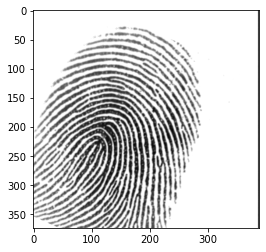

In [4]:
perpetrator_f = cv2.imread('fp_perpetrator.png')

assert ((perpetrator_f[:,:,0] == perpetrator_f[:,:,1]).all() 
    and (perpetrator_f[:,:,0] == perpetrator_f[:,:,2]).all())

perpetrator_f = cv2.cvtColor(perpetrator_f, cv2.COLOR_BGR2GRAY)

plt.imshow(perpetrator_f, cmap='gray')

Now let's have a look at the other fingerprint data that was provided. It is stored in folder `data/FVC2002/DB1_B/*` with filenames as XXY.tif with XX the individual number and Y the fingerprint number for this individual returns a list of images and a list of associated identity labels. In the code below we have provided a function that returns the data as a 2-tuple of image information and the labels. Have a look!

In [5]:
def read_DB(path):
    images = []
    labels = []
    imagePaths = sorted(Path(path).rglob("*.tif"))
    for imagePath in tqdm_notebook(imagePaths):
        image = cv2.imread(path + imagePath.name)
        if (len(image.shape) > 2):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        images.append(image)
        label = imagePath.stem[1:3]
        #label = imagePath.stem[:]
        labels.append(label)
    return (images, labels)

# select a Database
images_db, labels_db = read_DB('./data/FVC2002/DB1_B/')

# save data properties
n_images = len(images_db)
img_height, img_width = images_db[0].shape[0], images_db[0].shape[1]

Markdown("""
Let's have a look at the dataset... It contains {} images of size {}×{}. Let's visualise some:
""".format(n_images,img_height,img_width))

  0%|          | 0/80 [00:00<?, ?it/s]


Let's have a look at the dataset... It contains 80 images of size 374×388. Let's visualise some:


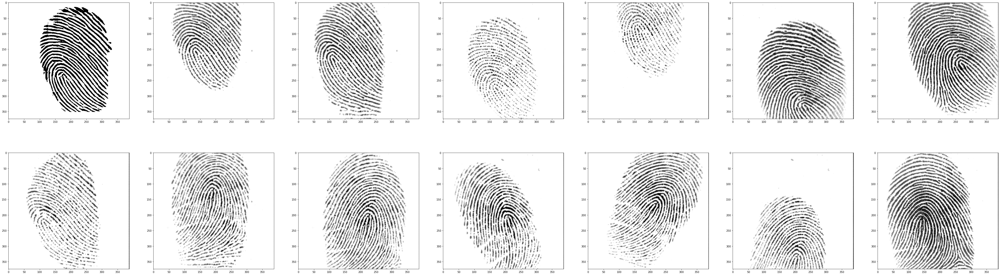

In [7]:
n = 14
plot_image_sequence(images_db, n)

### 2. A baseline model

#### 2.1. Choosing a similarity metric
In your first assignment the similarity metric was already provided, in this assignment you have the chance to play around with distances and similarities yourself! Let's give it a shot!

<div class="alert alert-block alert-success">
<b>Q1: </b> Take a look at the fingerprint similarity function below, is this a good metric to quantify a distance between two fingerprints? What are its limitations?
</div>

In [6]:
mss = lambda x,y: 1/(1+np.square(x-y).mean())

#### 2.2. Constructing the similarity matrix
Sadly the amount of data you have is very limited so it is a bad idea to start developing a biometric system based solely on the similarity with that one fingerprint as this might lead you on the wrong path (see overfitting)! Instead let's develop an identification system and evaluate it on all the data we have available.

Once we have a metric, we can just construct the similarity matrix and proceed as in the previous assignment!

In [7]:
def construct_similarity_tensor(img_db, labels, dist_func, exclude_img_duplicates=True):
    #dist_func is the function that computes the distance between two images
    data = []
    n_images = len(img_db)
    for i,j in product(range(n_images), range(n_images)):
        # if comparing the same image
        if exclude_img_duplicates and i == j:
            continue
        data.append([
            labels[i], labels[j],
            dist_func(img_db[i], img_db[j])])
    return pd.DataFrame(data, columns=['s1', 's2', 'd'])
    
sim_df0 = construct_similarity_tensor(images_db, labels_db, mss)

However... the setup is not completely the same, in previous session we only had 1 fingerprint per individual, in this setup we have 8. That means we have a total of 64 similarities between individuals! The `construct_distance_df` function does exclude similarity between the same images, resulting in 64-8 images for the diagonal. Why is this? 

In [8]:
sim_mat0 = sim_df0.pivot_table(index='s1', columns='s2',values='d',aggfunc = len)
sim_mat0

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,56.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0
02,64.0,56.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0
03,64.0,64.0,56.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0
04,64.0,64.0,64.0,56.0,64.0,64.0,64.0,64.0,64.0,64.0
05,64.0,64.0,64.0,64.0,56.0,64.0,64.0,64.0,64.0,64.0
06,64.0,64.0,64.0,64.0,64.0,56.0,64.0,64.0,64.0,64.0
07,64.0,64.0,64.0,64.0,64.0,64.0,56.0,64.0,64.0,64.0
08,64.0,64.0,64.0,64.0,64.0,64.0,64.0,56.0,64.0,64.0
09,64.0,64.0,64.0,64.0,64.0,64.0,64.0,64.0,56.0,64.0


<div class="alert alert-block alert-success">
<b>Q2: </b> Find a way to summarise/represent the score data for each pair of individuals, do you see any advantages/disadvantages?
</div>

In [9]:
sim_mat_median = sim_df0.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_median_ = sim_mat_median.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '10px'})
sim_mat_median_

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.024238,0.022298,0.018760,0.018693,0.021041,0.017937,0.020046,0.018592,0.026503,0.020600
02,0.022298,0.021564,0.018748,0.017902,0.019736,0.016960,0.019271,0.017835,0.024459,0.019323
03,0.018760,0.018748,0.017104,0.016766,0.017606,0.016480,0.017489,0.016708,0.020320,0.017263
04,0.018693,0.017902,0.016766,0.016961,0.017093,0.015855,0.016835,0.017019,0.020237,0.017012
05,0.021041,0.019736,0.017606,0.017093,0.018715,0.016555,0.018404,0.017168,0.021470,0.018486
06,0.017937,0.016960,0.016480,0.015855,0.016555,0.015337,0.016542,0.015738,0.018305,0.016415
07,0.020046,0.019271,0.017489,0.016835,0.018404,0.016542,0.018562,0.016877,0.020922,0.018470
08,0.018592,0.017835,0.016708,0.017019,0.017168,0.015738,0.016877,0.017028,0.019556,0.016781
09,0.026503,0.024459,0.020320,0.020237,0.021470,0.018305,0.020922,0.019556,0.030727,0.021467


#### 2.3. Validation of baseline identification system
Now that you've aggregate the similarity information you have a similarity matrix on the individual level. 

<div class="alert alert-block alert-success">
<b>Q3: </b> Use the similarity matrix to assess the performance of your system in identification setting. Report on the performance of your baseline.
</div>

In [10]:
def CMC(similarity_matrix):
    '''Constructs what is needed for the Cumulative Matching Characteristic Curve'''
    rows, columns = similarity_matrix.shape
    ranks = np.arange(1,rows+1)
    hits_per_rank = []
    for r in ranks:
        hits = 0
        for j in range(rows):
            a = similarity_matrix[j,:]
            indices = (-a).argsort()[:r]
            if j in indices: hits += 1
        hits = (hits/rows) * 100
        hits_per_rank.append(hits)
    return ranks, hits_per_rank

def plotCMC(ranks, hits_per_rank, name):
    '''Plots the CMC curve'''
    plt.plot(ranks, hits_per_rank, label = name)
    plt.axis([0.5, 10.5, 0, 110])
    plt.legend()
    plt.xlabel('Rank '+ str(len(ranks)))
    plt.ylabel('Rank '+ str(len(ranks))+ ' identification rate (%)')

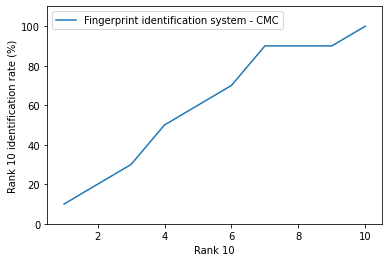

In [11]:
ranks, hits_per_rank = CMC(sim_mat_median.to_numpy())
plotCMC(ranks, hits_per_rank, 'Fingerprint identification system - CMC')

### 3. Model extension 1: local similarity
Ok that was our baseline result but I'm sure we can do much better! 

#### 3.1. Image enhancements
In this next step we re-use code developed by [Utkarsh Deshmukh](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python), to enhance the fingerprint images. It is a Python-recode of Matlab-code developed by [Peter Kovesi](https://www.peterkovesi.com/matlabfns/index.html#fingerprints). I have slightly adapted this code to make it more compliant with OpenCV. It uses gradient-based orientation and local frequency estimation as input to an orientation and frequency selective filtering using a Gabor filterbank. At the same time a foreground region segmentation (mask) is determined by calculating the standard deviation in local windows and thresholding above a certain level. Please briefly read through the [github](https://github.com/Utkarsh-Deshmukh/Fingerprint-Enhancement-Python) README.md to better understand what it is doing! 

In [ ]:
# Calcuate the enhanced images and the associated segmentation masks

def enhance_images(images):
    images_e_u = []
    masks = []
    for i, image in enumerate(tqdm_notebook(images)):
        try:
            # Gabor filtering
            img_e, mask, orientim, freqim = fe.image_enhance(image)
            # Normalize in the [0,255] range
            img_e_u = cv2.normalize(img_e, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
            images_e_u.append(img_e_u)
        except:
            print('error for: ', i)
            images_e_u.append(image)
        masks.append(mask)
    return np.array(images_e_u), np.array(masks)

images_enhanced_db, masks_db = enhance_images(images_db)

In [15]:
pickle.dump(images_enhanced_db, open( "images_enhanced_db.p", "wb" ))
pickle.dump(masks_db, open( "masks_db.p", "wb" ))

In [13]:
images_enhanced_db = pickle.load( open( "images_enhanced_db.p", "rb" ) )
masks_db = pickle.load( open( "masks_db.p", "rb" ) )

<div class="alert alert-block alert-info">
<b>Tip:</b> Intermediate (computation heavy) results can be saved on file using the pickle package, use <code>pickle.dump</code> for saving and <code>pickle.load</code> to load data from a file. Have a look at the <a href="https://wiki.python.org/moin/UsingPickle">wiki</a> for more information. </div>

Note that the images are now much more crisp and that the foreground segmentation was successful even if the technique is rather simple!

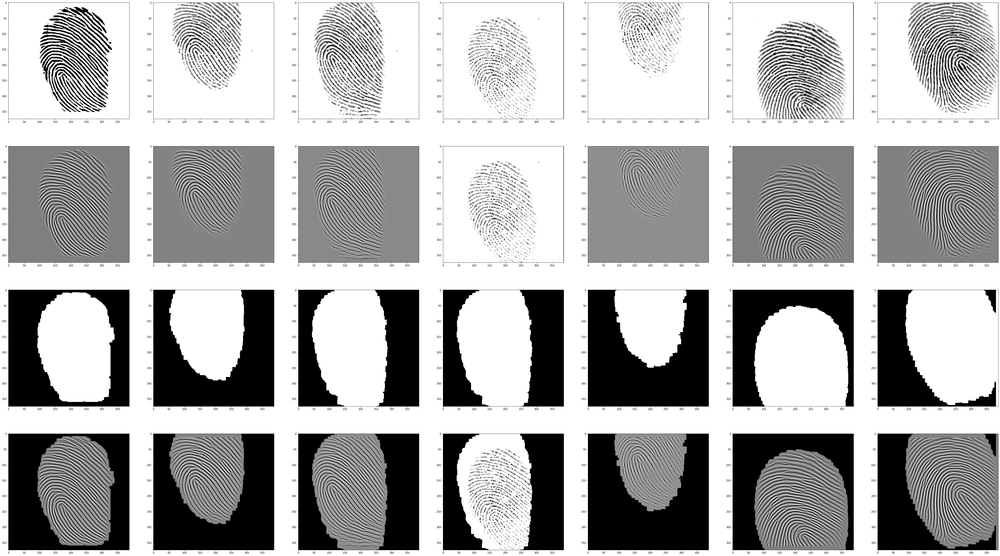

In [14]:
n=7
images_segmented_db = [a*b for a,b in zip(images_enhanced_db,masks_db)]
plot_image_sequence(images_db[:n] + images_enhanced_db.tolist()[:n] + masks_db.tolist()[:n] + images_segmented_db[:n], 4*n, n)

#### 3.2. Feature extraction
As you might have noticed by now comparing images on a pixel level is too simple and limited. The basic/traditional fingerprint matching algorithm are based on matching keypoints, called minutiae. They are defined as the ridge endings and bifurcations and can be determined by first thresholding the FP image and skeletonizing/thinning the enhanced image. For those really interested (but not part of this assignment) in experimenting with such an approach, some code is provided in the fprmodules/minutiae_extraction folder.

Instead, we will rely on establised methods developed in Computer Vision, where the use of keypoint features has proven to be very succesfull (prior to the advent of Deep Learning) in image classification, image alignment and object recognition tasks. A keypoint is a point of interest in an image, it does not necesarily need to be recognisable by a human but it can be. In this project we use keypoints to compare images on 3 levels:
1. Local feature descriptors
2. Global features
3. Hybrid features

To better highlight what is going on we will plot the results on two fingerprint images of the same individual.

In [16]:
# test example
testNr1 = 0
testNr2 = 7

**Keypoint detection** algorithms will result in points of interest on your image, which keypoints are used is dependent on the technique. We will make use of ORB (Oriented FAST and Rotated BRIEF) detection and descriptor algorithm as implemented in [OpenCV ORB](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_orb/py_orb.html#orb).


You are encouraged to try out a series of detection/description/matching algorithms. A short overview of these methods can be found in the OpenCV documentation: [keypoint detection descrption matching](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_table_of_contents_feature2d/py_table_of_contents_feature2d.html#py-table-of-content-feature2d). 
Please read these pages carefully and try to understand these methods.

In [17]:
def detect_keypoints(img, mask, keypoint_detector, kernel_size=(5,5)):
    """
        Detects keypoints in an image. 
        
        Note: Many false keypoints will be generated at the edge of the foreground mask, since ridges seem to terminate due to the clipping.
        we remove these by a morpholigical erosion (shrinking) of the foreground mask and deleting the keypoints outside.
    """
    # find the keypoints with ORB
    kp = keypoint_detector.detect(img)
    #convert mask to an unsigned byte
    mask_b = mask.astype(np.uint8)  
    # morphological erosion
    mask_e = cv2.erode(mask_b*255, kernel = np.ones(kernel_size,np.uint8), iterations = 5)
    # remove keypoints and their descriptors that lie outside this eroded mask
    kpn = [kp[i] for i in range(len(kp)) if mask_e.item(int(kp[i].pt[1]),int(kp[i].pt[0])) == 255] 
    return kpn

detector = cv2.ORB_create()

kp1 = detect_keypoints(images_enhanced_db[testNr1], masks_db[testNr1], detector)
kp2 = detect_keypoints(images_enhanced_db[testNr2], masks_db[testNr2], detector)

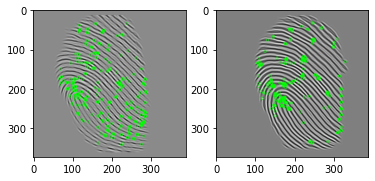

In [18]:
img1 = cv2.drawKeypoints(images_enhanced_db[testNr1],kp1,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img2 = cv2.drawKeypoints(images_enhanced_db[testNr2],kp2,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2)
_=axarr[0].imshow(img2),axarr[1].imshow(img1),plt.show()

**The Local Feature descriptor** will give you a vector describing the local region around the key-point in the feature space. Note that these feature descriptors give a vectorial summary of the neighbourhood around each keypoint. A simple metric on these vectors (Euclidean Distance for continuous variables, Hamming Distance for binary variables) can then be used to determine similarity.

<div class="alert alert-block alert-success">
<b>Q4: </b> Visualise the local descriptors. Briefly explain the way the feature descriptor works.
</div>

In [19]:
def compute_local_descriptor(img, kp, detector):
    kp, des = detector.compute(img, kp)
    return np.array(kp), des

kp1, local_des1 = compute_local_descriptor(images_enhanced_db[testNr1], kp1, detector)
kp2, local_des2 = compute_local_descriptor(images_enhanced_db[testNr2], kp2, detector)

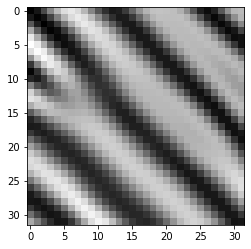

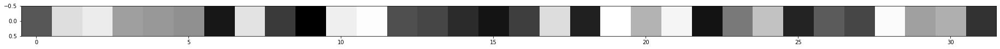

In [20]:
#The following process is only for the first keypoint between person 01 and 07 
loc_des_kp = local_des1[0,:] #Take the descriptor of the first keypoint as an example
x = kp1[0].pt[0]
y = kp1[0].pt[1] #Take the (x,y) position of the first keypoint

#Plot area around the keypoint
image_area = images_enhanced_db[testNr1]
patch_x = int(x - 16)
patch_y = int(y - 16)
area = image_area[patch_x:patch_x+32, patch_y:patch_y+32]
plt.imshow(area, cmap='gray')

#Visualize descriptor
lnew = np.reshape(loc_des_kp,(32,1)) 
plt.figure(figsize=(32,32))
plt.imshow(lnew.T, cmap='gray')

#### 3.3. local Keypoint Matching

**Keypoint Matchers** match keypoints that have similar descriptors in an image pair and computes the distances between the best matching pairs of keypoints. In this implementation we make use of the brute force matcher of OpenCV, documentation can be found [here](https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_feature2d/py_matcher/py_matcher.html#matcher). As a distance between descriptors we make use of the normalised [Hamming distance](https://en.wikipedia.org/wiki/Hamming_distance). 

In [21]:
def brute_force_matcher(des1, des2, dist=cv2.NORM_HAMMING):
    """
      Brute Force matcher on a pair of KeyPoint sets using the local descriptor for similarity
      
      returns all pairs of best matches
    """
    
    # crossCheck=True only retains pairs of keypoints that are each other best matching pair
    bf = cv2.BFMatcher(dist, crossCheck=True)
    matches = bf.match(des1, des2)
    
    # sort matches based on descriptor distance
    matches.sort(key=lambda x: x.distance, reverse=False)
    
    return np.array(matches)

# store the local keypoint matches
local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)

# save the source index and target index of the keypoints in the corresponding keypoint sets
local_pt_source, local_pt_target = np.array([
    (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T

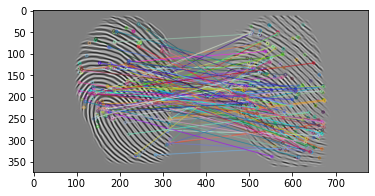

In [22]:
# show the matched keypoints

imMatches = cv2.drawMatches(images_enhanced_db[testNr1],kp1,
                            images_enhanced_db[testNr2],kp2,local_k1_k2_matches, None) 
_=plt.imshow(imMatches),plt.show()

<div class="alert alert-block alert-info">
<b>Tip:</b> Make sure you spent the proper amount of time on constructing the similarity metrics, a good implementation will save you a lot of time in the long run! </div>

In [23]:
#Function that normalizes a DataFrame
def normalize_df(df):
    '''Normalizing df values'''
    x = df[['d']].values #returns a numpy array
    min_max_scaler = preprocessing.MinMaxScaler()
    x_scaled = min_max_scaler.fit_transform(x) #Normalize scores
    df[['d']] = x_scaled
    return df

#### 3.4 Local Similarity metric
Now that we have matching keypoints we can define simple scalar measures on this set of distances, such as the number of pairs with a distance smaller than a set threshold, or the sum/mean of the first N distances (ranked from small to larger), etc.

<div class="alert alert-block alert-success">
<b>Q5: </b> Choose a local feature similarity function, (e.g. number of pairs with feature distance below a set distance threshold, the sum or mean of the feature distance of the best N pairs, or any other function you think is a good candidate)
</div>

In [24]:
def local_img_similarity(matches):
    np_matches = np.array([])
    for match in matches:
        np_matches = np.append(np_matches, match.distance)
    
    #Take the best 30 descriptor distances
    sim = np.mean(np_matches[:30])
    similarity = 1/(1+sim)
    
    return similarity

#Example of a local similarity score
sim = local_img_similarity(local_k1_k2_matches)
sim

0.018575851393188854

#### 3.5 Construct local similarity matrix 


In [25]:
def local_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # distances between matches that are below threshold
    return local_img_similarity(local_k1_k2_matches)
    
# compute similarity tensor 
sim_df1 = construct_similarity_tensor(np.stack([images_enhanced_db,masks_db],-1), labels_db, local_similarity)
sim_df1

,s1,s2,d
0,01,01,0.021946
1,01,01,0.019145
2,01,01,0.013643
3,01,01,0.017996
4,01,01,0.020436
...,...,...,...
6315,10,10,0.017953
6316,10,10,0.018018
6317,10,10,0.018797
6318,10,10,0.016556


In [26]:
#Normalize values
sim_df1 = normalize_df(sim_df1)

In [27]:
# aggregate similarities
sim_mat_median_local = sim_df1.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_local_ = sim_mat_median_local.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '10px'})
sim_mat_local_

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.300497,0.329164,0.249084,0.218938,0.267460,0.243331,0.203504,0.153820,0.254465,0.242822
02,0.329164,0.438250,0.226664,0.205889,0.287758,0.234543,0.220515,0.145979,0.281935,0.249327
03,0.249084,0.226664,0.286164,0.220067,0.202856,0.225289,0.179036,0.155524,0.191174,0.201349
04,0.218938,0.205889,0.220067,0.278290,0.187221,0.222326,0.161067,0.161837,0.174410,0.193271
05,0.267460,0.287758,0.202856,0.187221,0.391670,0.208945,0.198779,0.137950,0.243539,0.226891
06,0.243331,0.234543,0.225289,0.222326,0.208945,0.309647,0.175410,0.151562,0.192851,0.198780
07,0.203504,0.220515,0.179036,0.161067,0.198779,0.175410,0.236269,0.122943,0.193902,0.182492
08,0.153820,0.145979,0.155524,0.161837,0.137950,0.151562,0.122943,0.235716,0.128164,0.145979
09,0.254465,0.281935,0.191174,0.174410,0.243539,0.192851,0.193902,0.128164,0.357938,0.228271


#### 3.6. Evaluating local model

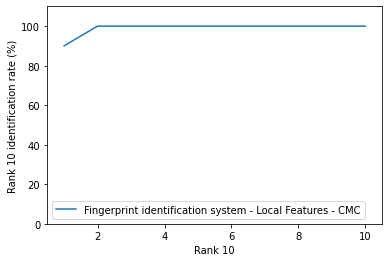

In [28]:
ranks_local, hits_per_rank_local = CMC(sim_mat_median_local.to_numpy())
plotCMC(ranks_local, hits_per_rank_local, 'Fingerprint identification system - Local Features - CMC')

### 4. Model extension 2: Global similarity

**Global features**, here we use the matching keypoints to align the fingerprints, this allows us to compare the images as a whole (globally). Once the images are aligned we can take into account the distance between the key-points in the ambient space (the coordinates of the key-points). This is also referred to as geometrical distance since this is just comparing two points that are part of the intrinsic geometry of the object (no matter how you move the image around the point will move around with it and stay in the same location on the finger).

#### 4.1 Image alignment
[Here](https://www.learnopencv.com/image-alignment-feature-based-using-opencv-c-python/) you can find a description and code how to start from the brute force matching results and estimate the best transformation (from a family of transformations) that aligns the two images. In the example, a homography-type transformation is searched for. However, this has too many degrees of freedom for our application. We substituted this by a more constrained (only 4 degrees of freedom) similarity (partial affine) transformation.

These routines iteratively determine the minimal set of matching points that define a transformation that optimally aligns all other points as well, taking care of outliers at the same time. This method is a very general optimization technique and is called RANSAC, for "RANdom SAmple Consensus". See, apart from many other sources on the internet, [this presentation](http://www.cse.psu.edu/~rtc12/CSE486/lecture15.pdf) for further explanation. 

In [29]:
def estimate_affine_transform_by_kps(src_pts, dst_pts):
    """
        Returns the Affine transformation that aligns two sets of points
    """
    transform_matrix, inliers = cv2.estimateAffinePartial2D(src_pts, dst_pts, 
                                           method =  cv2.RANSAC, 
                                           confidence = 0.9, 
                                           ransacReprojThreshold = 10.0, 
                                           maxIters = 5000, 
                                           refineIters = 10)
    return transform_matrix, inliers[:,0]

def warp_points(pts, M):
    mat_reg_points = cv2.transform(pts.reshape(-1,1,2), M)
    
    # return transformed keypoint list
    return cv2.KeyPoint.convert(mat_reg_points) 

def warp_img(img, M):
    return cv2.warpAffine(img, M, (img.shape[1], img.shape[0]))

# estimate the affine transform that aligns the matched keypoints
M, inliers = estimate_affine_transform_by_kps(
    cv2.KeyPoint.convert(kp1[local_pt_source]), 
    cv2.KeyPoint.convert(kp2[local_pt_target]))

kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
img1_reg = warp_img(images_enhanced_db[testNr1], M)

Let's have a look at the images and keypoints now that the images are aligned

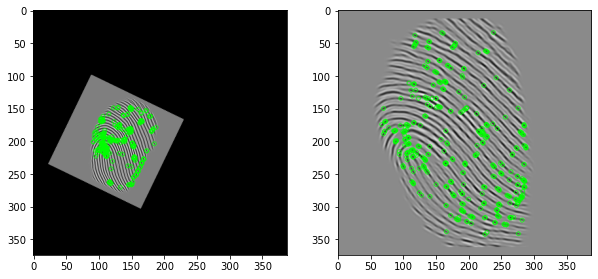

In [30]:
show_img1 = cv2.drawKeypoints(img1_reg, kp1_reg, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)
show_img2 = cv2.drawKeypoints(images_enhanced_db[testNr2], kp2, None, (0, 255, 0), cv2.DRAW_MATCHES_FLAGS_DEFAULT)

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
_=ax[0].imshow(show_img1), ax[1].imshow(show_img2), plt.show()

As you might have noticed the `estimateAffinePartial2D` function does not only return the transformation matrix but also the minimal set of matching points that were used to to determine the transformation. This gives us a better, more refined set of keypoints. 

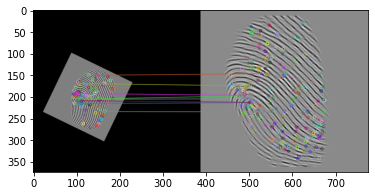

In [31]:
global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

imMatches = cv2.drawMatches(img1_reg, kp1_reg, images_enhanced_db[testNr2], kp2, global_k1_k2_matches.tolist(), None)
_ = plt.imshow(imMatches), plt.show()

#### 4.2 Global Similarity Metric

<div class="alert alert-block alert-success">
<b>Q6: </b> Choose a global feature similarity function, (e.g. you can start from euclidean distance between the reduced sets of KeyPoints and count the values above a threshold)
</div>

In [32]:
import math
all_distances = []
def global_img_similarity(matches, reg_kp1, kp2):
    # distance between aligned keypoints
    distances = []
    
    for match in matches:
        train_ids = match.trainIdx
        query_ids = match.queryIdx
    
        p1 = reg_kp1[query_ids].pt
        p2 = kp2[train_ids].pt
        dist = math.sqrt(((p1[0]-p2[0])**2)+((p1[1]-p2[1])**2))
        distances.append(dist)
        all_distances.append(distances)

    similarity = (sum(d <= 1.5 for d in distances))/len(distances) 
    return similarity

#### 4.3 Construct global similarity matrix 

In [33]:
def global_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size = kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size = kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]
    
    # compute global similarity based aligned matching global keypoints
    return global_img_similarity(global_k1_k2_matches,kp1_reg, kp2)
 
# compute similarity tensor 
sim_df2 = construct_similarity_tensor(np.stack([images_enhanced_db,masks_db],-1), labels_db, global_similarity)

In [34]:
sim_df2 = normalize_df(sim_df2)

In [35]:
# aggregate features
sim_mat_mean_global = sim_df2.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_mean_global

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.111765,0.044118,0.101070,0.092246,0.096257,0.105882,0.101070,0.092246,0.081448,0.096257
02,0.101070,0.288770,0.117647,0.117647,0.101070,0.105882,0.088852,0.088235,0.096257,0.117647
03,0.105882,0.078539,0.125000,0.105882,0.111765,0.111765,0.078539,0.092246,0.096257,0.092246
04,0.105882,0.076018,0.081448,0.161662,0.000000,0.084842,0.096257,0.096257,0.084842,0.040724
05,0.096257,0.081448,0.081933,0.132353,0.370588,0.117647,0.088235,0.081448,0.088235,0.105882
06,0.081448,0.068957,0.096257,0.105882,0.092246,0.330882,0.088235,0.078539,0.088235,0.117647
07,0.081448,0.088235,0.092246,0.105882,0.105882,0.084842,0.235294,0.081448,0.096257,0.084842
08,0.075630,0.070588,0.105882,0.101070,0.084842,0.092246,0.075630,0.317647,0.081448,0.088235
09,0.088235,0.088235,0.117647,0.000000,0.092246,0.097059,0.079412,0.096257,0.529412,0.000000


#### 4.4. Evaluate global model

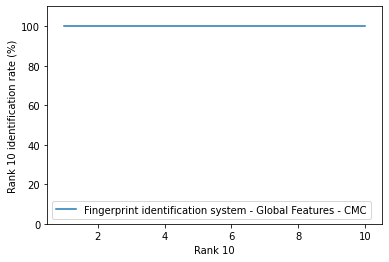

In [36]:
ranks_global, hits_per_rank_global = CMC(sim_mat_mean_global.to_numpy())
plotCMC(ranks_global, hits_per_rank_global, 'Fingerprint identification system - Global Features - CMC')

### 5. Model extension 3: Hybrid features

#### 5.1 Hybrid Similarity metric

<div class="alert alert-block alert-success">
<b>Q7: </b> Choose a hybrid feature similarity function that makes use of both the geometric distance and the feature distance of the keypoints.
</div>

In [37]:
def hybrid_img_similarity(matches, kp1_reg, kp2):
    # distance between aligned keypoints combined with feature distance
    sim_local = local_img_similarity(matches)
    sim_global = global_img_similarity(matches, kp1_reg, kp2)
    
    #Find the mean between the local and global scores
    similarity = (sim_local+sim_global)/2
    return similarity

#### 5.2 Construct hybrid similarity matrix

In [38]:
def hybrid_similarity(masked_fp1, masked_fp2, detector=cv2.ORB_create(), kp_erosion_ksize = (5,5)):
    # separate the semgentation from the image
    fp1, mask1 = masked_fp1[...,0], masked_fp1[...,1] 
    fp2, mask2 = masked_fp2[...,0], masked_fp2[...,1] 
    
    # detect the keypoints
    kp1 = detect_keypoints(fp1, mask1, detector, kernel_size=kp_erosion_ksize)
    kp2 = detect_keypoints(fp2, mask2, detector, kernel_size= kp_erosion_ksize)
    
    # compute descriptor for each keypoints
    kp1, local_des1 = compute_local_descriptor(fp1, kp1, detector)
    kp2, local_des2 = compute_local_descriptor(fp2, kp2, detector)
    
    # find matches between keypoints based on local feature descriptor
    local_k1_k2_matches = brute_force_matcher(local_des1, local_des2, cv2.NORM_HAMMING)
    
    # get source and target index for each match
    local_pt_source, local_pt_target = np.array([
        (match.queryIdx, match.trainIdx) for match in local_k1_k2_matches]).T
    
    # use matching keypoints to estimate an affine transform between keypoints
    M, inliers = estimate_affine_transform_by_kps(
        cv2.KeyPoint.convert(kp1[local_pt_source]), 
        cv2.KeyPoint.convert(kp2[local_pt_target]))
    
    # if no inliers can be found
    if M is None: 
        return 0
    
    # warp the keypoints according to the found transform
    kp1_reg = warp_points(cv2.KeyPoint.convert(kp1), M)
    
    # subset the keypoints, inliers are considered good keypoints
    # since they were used in finding the transformation
    global_k1_k2_matches = local_k1_k2_matches[inliers == 1]

     # compute hybrid similarity based on aligned matching keypoints
    return hybrid_img_similarity(global_k1_k2_matches, kp1_reg, kp2)
    
sim_df3 = construct_similarity_tensor(np.stack([images_enhanced_db,masks_db],-1), labels_db, hybrid_similarity)

In [39]:
# aggregate features
sim_mat_mean_hybrid = sim_df3.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_mean_hybrid

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.059905,0.028187,0.053881,0.049349,0.051817,0.056026,0.053888,0.049295,0.044541,0.051952
02,0.053622,0.143222,0.061846,0.061687,0.053955,0.055725,0.048061,0.047780,0.051381,0.061488
03,0.055680,0.043062,0.065548,0.056838,0.059241,0.058977,0.043026,0.049502,0.051280,0.049949
04,0.056152,0.041690,0.044727,0.084178,0.006592,0.046083,0.051766,0.051437,0.046072,0.025729
05,0.051409,0.044517,0.044875,0.068549,0.183547,0.061524,0.047728,0.044543,0.047363,0.056024
06,0.044434,0.038420,0.051771,0.056195,0.049594,0.164524,0.047835,0.042868,0.047787,0.061403
07,0.044486,0.047726,0.049438,0.055872,0.056366,0.045977,0.118799,0.044255,0.051179,0.046318
08,0.041607,0.039257,0.055860,0.053707,0.045948,0.049558,0.041588,0.158280,0.044336,0.047458
09,0.047409,0.048158,0.061390,0.006983,0.049984,0.051566,0.044027,0.051099,0.258282,0.007242


#### 5.3. Evaluate hybrid model

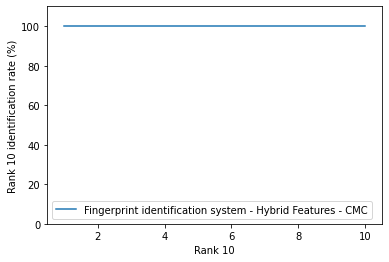

In [40]:
ranks_hybrid, hits_per_rank_hybrid = CMC(sim_mat_mean_hybrid.to_numpy())
plotCMC(ranks_hybrid, hits_per_rank_hybrid, 'Fingerprint identification system - Hybrid Features - CMC')

### 6. Solve the murder case

<div class="alert alert-block alert-success">
<b>Q8: </b> Use your fingerprint biometric system to solve the murder case (find the subject whos fingerprint is closest to <code>perpetrator_f</code>)! Do you feel confident in your prediction? If not, provide 3 reasons on why your performance might be off. If you are, think of a way to quantify your certainty and report on it.  
</div>

<div class="alert alert-block alert-info">
<b>Tip:</b> Remember to use the same preprocessing steps on the perpetrator image! </div>

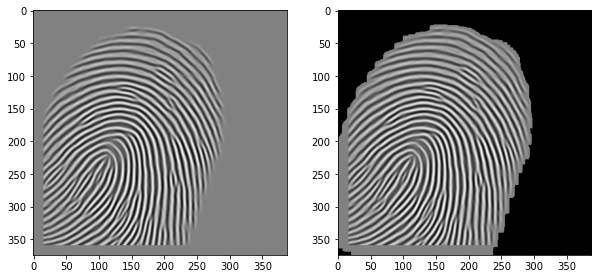

In [41]:
#Enhance perpetrator image
def enhance_image(image):
    try:
        #Gabor filtering
        img_e, mask, orientim, freqim = fe.image_enhance(image)
        # Normalize in the [0,255] range
        img_e_u = cv2.normalize(img_e, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
    except:
        print('error for: ', i)
        images_e_u.append(image)
    return img_e_u, np.array(mask)


image_enhanced_perp, mask_perp = enhance_image(perpetrator_f)
image_segmented_perp = image_enhanced_perp*mask_perp

fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
_=ax[0].imshow(image_enhanced_perp, cmap='gray'), ax[1].imshow(image_segmented_perp, cmap='gray'), plt.show()

In [42]:
#(Re)load enhanced images 
images_enhanced_db = pickle.load( open( "images_enhanced_db.p", "rb" ) )
masks_db = pickle.load( open( "masks_db.p", "rb" ))

#Construct a bigger table by adding the perpetrator as a person
images_enhanced_db = np.vstack((images_enhanced_db, [image_enhanced_perp]))
masks_db = np.vstack((masks_db, [mask_perp]))
labels_db = np.append(labels_db, 'Perp')

In [43]:
sim_df4 = construct_similarity_tensor(np.stack([images_enhanced_db, masks_db],-1), labels_db, hybrid_similarity)
sim_df4 = normalize_df(sim_df4)
sim_mat_perp_fing = sim_df4.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_perp_fing.style.background_gradient(cmap ='viridis').set_properties(**{'font-size': '10px'})

s2,01,02,03,04,05,06,07,08,09,10,Perp
s1,,,,,,,,,,,
01,0.114647,0.047951,0.101979,0.092450,0.097639,0.106491,0.101994,0.092336,0.082340,0.097924,0.003763
02,0.101434,0.289844,0.118727,0.118395,0.102134,0.105857,0.089743,0.089150,0.096723,0.117977,0.172373
03,0.105762,0.079230,0.126514,0.108197,0.113251,0.112694,0.079154,0.092771,0.096511,0.093713,0.115161
04,0.106755,0.076344,0.082730,0.165688,0.002541,0.085582,0.097533,0.096840,0.085560,0.042782,0.108062
05,0.096781,0.082288,0.083043,0.132823,0.374640,0.118051,0.089041,0.082343,0.088275,0.106486,0.112243
06,0.082114,0.069468,0.097542,0.106846,0.092964,0.334637,0.089267,0.078823,0.089165,0.117796,0.101165
07,0.082225,0.089036,0.092636,0.106167,0.107204,0.085359,0.238488,0.081738,0.096297,0.086077,0.001381
08,0.076169,0.071228,0.106141,0.101615,0.085298,0.092889,0.076130,0.321508,0.081909,0.088474,0.106911
09,0.088370,0.089946,0.117770,0.003362,0.093785,0.097113,0.081260,0.096130,0.531792,0.003909,0.049998


In [63]:
#Solve the murder:
def find_perp(df):
    '''Function that finds the perpetrator'''
    c_rows = df.idxmax(axis=1)
    c_cols = df.idxmax(axis=0)
    perp_rows = c_rows.loc['Perp']
    perp_cols = c_cols.loc['Perp']
    
    if perp_rows == perp_cols:
        suspects = [perp_rows]
        print("The main suspect is person " + perp_rows)
    else:
        print("There are two suspects: person "+ perp_rows + " and person "+perp_cols)
        suspects = [perp_rows, perp_cols]
    return suspects

In [420]:
# Find perpetrator
perp_fing = find_perp(sim_mat_perp_fing)

The main suspect is person 02


In [172]:
#Find the individual with the highest similarity value (before taking the median) 
df1 = sim_df4.loc[(sim_df4['s1'] == 'Perp') & (sim_df4['s2'] == perp_fing[0])]
df2 = sim_df4.loc[(sim_df4['s2'] == 'Perp') & (sim_df4['s1'] == perp_fing[0])]
frames = [df1, df2]
result = pd.concat(frames)
max_value = result['d'].max() #The maximum similarity value
max_index = result['d'].argmax() #The index of the row that has the highest value
result.iloc[max_index]

s1        Perp
s2          02
d     0.341929
Name: 6413, dtype: object

Let's print the perpetator and suspect images side by side

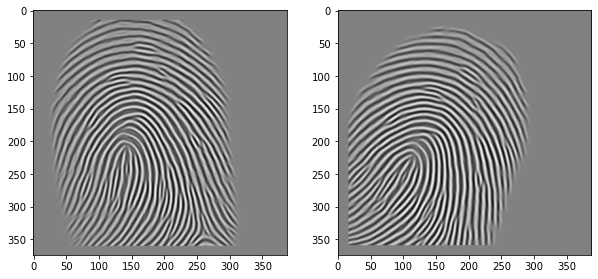

In [176]:
killer = images_enhanced_db[labels_db==perp_fing[0]]
fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize=(10,10))
_=ax[0].imshow(killer[5], cmap='gray'), ax[1].imshow(image_enhanced_perp, cmap='gray'), plt.show()

The similarity is quite obvious, therefore we can have some confidence that this is the perpetrator. 

## III. Iris recognition
Now let's create a biometric system for the iris data. 

In [46]:
# set path
iris_data_path = 'data/CASIA1/CASIA Iris Image Database (version 1.0)'

### 1. Reading data

<div class="alert alert-block alert-success">
<b>Q9: </b> Plot <code>iris_perpetrator.png</code>. Where do you see difficulties? what kind of similarity measures do you expect to work best?
</div>

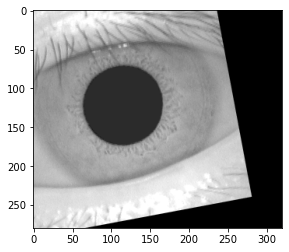

In [47]:
perpetrator_iris = cv2.imread('iris_perpetrator.png')
perpetrator_iris = cv2.cvtColor(perpetrator_iris, cv2.COLOR_BGR2GRAY)
plt.imshow(perpetrator_iris, cmap='gray')

Let's read the iris data... From the README: The images are stored as：XXX \ S \ XXX_S_Y.bmp XXX: the unique identifier of eye, range from 000 to 108. S: the index of session.‘1’denotes the first session and‘2’the second session. Y: the index of image in the same session. Range from 1 to 3 in the first session, 1 to 4 in the second session. Therefore XXX_S_Y.bmp means the iris image with index Y in session S from eye XXX.

In [48]:
def read_iris_DB(path):
    images = []
    labels = []
    imagePaths = sorted(glob.glob(os.path.join(path, '*/1/*.bmp')))
    for imagePath in imagePaths:
        label = imagePath.split('\\')[-3] 
        image = cv2.imread(imagePath)
        
        # we only read data of the first 10 subjects
        if label == '011':
            break
        
        if (len(image.shape) > 2):
            image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        images.append(image)
        labels.append(label[1:])

    return np.array(images), np.array(labels)

# read iris Database
iris_images, iris_labels = read_iris_DB(iris_data_path)

# save data properties
n_images = len(iris_images)
img_height, img_width = iris_images[0].shape[0], iris_images[0].shape[1]

Markdown("""
Let's have a look at the dataset... It contains {} images of size of the images is {}×{}. Let's visualise the first n:
""".format(n_images,img_height,img_width))


Let's have a look at the dataset... It contains 30 images of size of the images is 280×320. Let's visualise the first n:


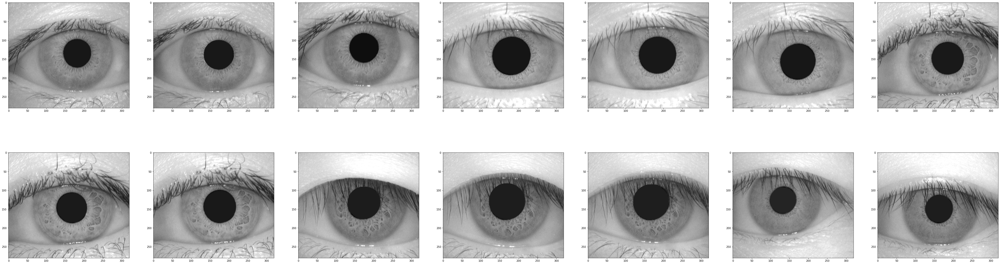

In [49]:
n = 14
plot_image_sequence(iris_images, n)

### 2. Biometric iris recogntion System
#### 2.1. Image enhancement
Similar to the image enhancement in the [fingerprints](#3.1.-Image-enhancements) section, we will use [open source code](https://github.com/thuyngch/Iris-Recognition) to segment (based on Daugman's intefro-differential) and normalise (by unwraping the circular region) the iris images. We strongly encourage you to go through the source code or github repository to learn more. 

Also similar to the fingerprint section we enhance the images using a gabor filter bank, this time we implement this using [OpenCV](https://docs.opencv.org/3.4/d4/d86/group__imgproc__filter.html#gae84c92d248183bd92fa713ce51cc3599). 

In [50]:
import warnings
warnings.filterwarnings('ignore')

from src.irismodules.iris_recognition.python.fnc import segment, normalize

# we use the same hyper parameters as in the enroll-casia1.py example
# feel free to play around with these!
eyelashes_thres = 80
radial_res = 200
angular_res = 400

def segment_iris(img):
    # Segment the iris region from the eye image. Indicate the noise region.
    ciriris, cirpupil, imwithnoise = segment.segment(img)

    # Normalize iris region by unwraping the circular region into a rectangular block of constant dimensions.
    polar_iris, mask = normalize.normalize(
        imwithnoise, ciriris[1], ciriris[0], ciriris[2], cirpupil[1], cirpupil[0], cirpupil[2], radial_res, angular_res)
    
    return polar_iris, (mask == 0)      

def get_filter_bank():
    # this filterbank comes from https://cvtuts.wordpress.com/
    filters = []
    ksize = 5
    for theta in np.arange(0, np.pi, np.pi / 16):
        kern = cv2.getGaborKernel((ksize, ksize), 4.0, theta, 10.0, 0.5, 0, ktype=cv2.CV_32F)
        kern /= 1.5*kern.sum()
        filters.append(kern)
    return filters
    
def enhance_iris(img, eps = 1.e-15, agg_f = np.max):
    # get the gabor filters
    filters = get_filter_bank()

    # apply filters to image
    enhanced_image = np.array([cv2.filter2D(img, ddepth = -1, kernel=k) for k in filters])
    
    # Normalize in the [0,255] range
    enhanced_image = cv2.normalize(enhanced_image, None, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX, dtype=0)
    
    # aggregate features
    return agg_f(enhanced_image,0)
    
def enhance_and_segment_irises(images):
    enhanced_images, masks = [], []
    for img in images:
        normalised_img, mask = segment_iris(img)
        enhanced_img = enhance_iris(normalised_img)
        
        masks.append(mask)
        enhanced_images.append(enhanced_img)
    
    return np.array(enhanced_images), np.array(masks)
        
enhanced_iris, mask_iris = enhance_and_segment_irises(iris_images)

In [51]:
pickle.dump(enhanced_iris, open( "enhanced_iris.p", "wb" ))
pickle.dump(mask_iris, open( "mask_iris.p", "wb" ))

In [52]:
enhanced_iris = pickle.load( open( "enhanced_iris.p", "rb" ) )
mask_iris = pickle.load( open( "mask_iris.p", "rb" ) )

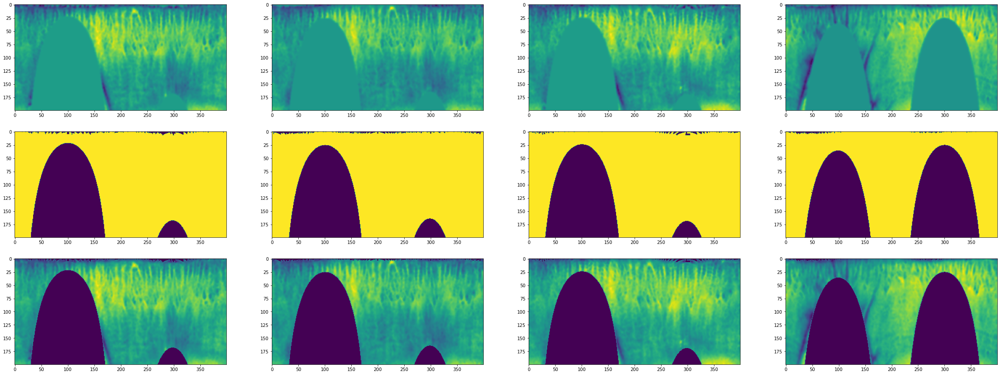

In [53]:
n=4

iris_segmented_db = np.array([a*b for a,b in zip(enhanced_iris, mask_iris)])
plot_image_sequence(enhanced_iris.tolist()[:n] + mask_iris.tolist()[:n] + iris_segmented_db.tolist()[:n], 3*n, n, figsize= (10,5), cmap='viridis')

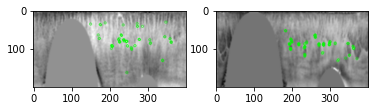

In [54]:
#Local feature extraction example for iris
kp1_iris = detect_keypoints(enhanced_iris[testNr1], mask_iris[testNr1], detector)
kp2_iris = detect_keypoints(enhanced_iris[testNr2], mask_iris[testNr2], detector)
img3 = cv2.drawKeypoints(enhanced_iris[testNr1],kp1_iris,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)
img4 = cv2.drawKeypoints(enhanced_iris[testNr2],kp2_iris,None,color=(0,255,0), flags=cv2.DRAW_MATCHES_FLAGS_DEFAULT)

f, axarr = plt.subplots(1,2)
_=axarr[0].imshow(img3),axarr[1].imshow(img4),plt.show()

#### 2.2. Construct similarity matrix

<div class="alert alert-block alert-success">
<b>Q10: </b> Construct the similarity matrix based on local, global <u>or</u> hybrid features. Your choice! 
</div>

In [55]:
sim_df_iris = construct_similarity_tensor(np.stack([enhanced_iris,mask_iris],-1), iris_labels, local_similarity)
sim_mat_iris = sim_df_iris.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)
sim_mat_iris

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.015454,0.012821,0.013319,0.013135,0.013408,0.012948,0.013249,0.012270,0.013542,0.012869
02,0.012821,0.017050,0.013285,0.013151,0.012821,0.013174,0.013092,0.013514,0.013043,0.013771
03,0.013319,0.013285,0.025126,0.013636,0.012980,0.012981,0.013241,0.013746,0.013351,0.013212
04,0.013135,0.013151,0.013636,0.013245,0.012830,0.012981,0.012860,0.012755,0.013038,0.012868
05,0.013408,0.012821,0.012980,0.012830,0.016698,0.012796,0.013139,0.012500,0.015306,0.013825
06,0.012948,0.013174,0.012981,0.012981,0.012796,0.015562,0.013110,0.012521,0.012121,0.012335
07,0.013249,0.013092,0.013241,0.012860,0.013139,0.013110,0.015510,0.012885,0.013767,0.013199
08,0.012270,0.013514,0.013746,0.012755,0.012500,0.012521,0.012885,0.014035,0.013123,0.013286
09,0.013542,0.013043,0.013351,0.013038,0.015306,0.012121,0.013767,0.013123,0.016949,0.014894


#### 2.3. Model evaluation
Now evaluate your model

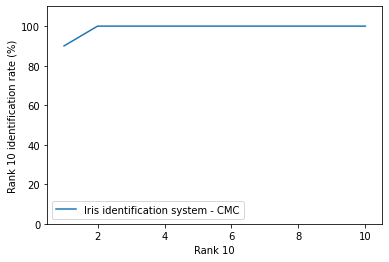

In [56]:
ranks_iris, hits_per_rank_iris = CMC(sim_mat_iris.to_numpy())
plotCMC(ranks_iris, hits_per_rank_iris, 'Iris identification system - CMC')

### 3. Solve the murder case

<div class="alert alert-block alert-success">
<b>Q11: </b> Use your iris biometric system to solve the murder case! Do you feel confident in your prediction?
</div>

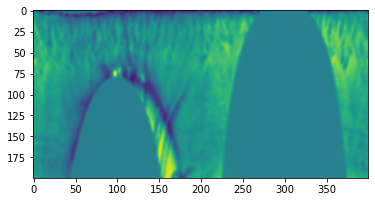

In [57]:
#Preprocess perpetrator iris
normalised_iris, mask_perp = segment_iris(perpetrator_iris)
enhanced_perp = enhance_iris(normalised_iris)
plt.imshow(enhanced_perp, cmap='viridis')

Add the perpetrator in the similarity matrix once again:

In [58]:
images_enhanced_iris = np.vstack((enhanced_iris, [enhanced_perp]))
masks_extended_iris = np.vstack((mask_iris, [mask_perp]))
labels_extended_iris = np.append(iris_labels, 'Perp')

sim_df_iris_2 = construct_similarity_tensor(np.stack([images_enhanced_iris, masks_extended_iris],-1), labels_extended_iris, local_similarity)
sim_mat_iris_perp = sim_df_iris_2.pivot_table(index='s1', columns='s2',values='d',aggfunc = np.median)

sim_mat_iris_perp

s2,01,02,03,04,05,06,07,08,09,10,Perp
s1,,,,,,,,,,,
01,0.015454,0.012821,0.013319,0.013135,0.013408,0.012948,0.013249,0.012270,0.013542,0.012869,0.013208
02,0.012821,0.017050,0.013285,0.013151,0.012821,0.013174,0.013092,0.013514,0.013043,0.013771,0.016270
03,0.013319,0.013285,0.025126,0.013636,0.012980,0.012981,0.013241,0.013746,0.013351,0.013212,0.013127
04,0.013135,0.013151,0.013636,0.013245,0.012830,0.012981,0.012860,0.012755,0.013038,0.012868,0.012667
05,0.013408,0.012821,0.012980,0.012830,0.016698,0.012796,0.013139,0.012500,0.015306,0.013825,0.014553
06,0.012948,0.013174,0.012981,0.012981,0.012796,0.015562,0.013110,0.012521,0.012121,0.012335,0.013107
07,0.013249,0.013092,0.013241,0.012860,0.013139,0.013110,0.015510,0.012885,0.013767,0.013199,0.013580
08,0.012270,0.013514,0.013746,0.012755,0.012500,0.012521,0.012885,0.014035,0.013123,0.013286,0.012543
09,0.013542,0.013043,0.013351,0.013038,0.015306,0.012121,0.013767,0.013123,0.016949,0.014894,0.013453


In [64]:
perp_fing = find_perp(sim_mat_iris_perp)

The main suspect is person 02


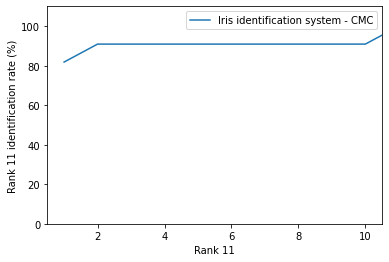

In [65]:
ranks_iris2, hits_per_rank_iris2 = CMC(sim_mat_iris_perp.to_numpy())
plotCMC(ranks_iris2, hits_per_rank_iris2, 'Iris identification system - CMC')

In [66]:
#Find the largest score in the tensor (before taking the median)
frames2 = [df1a, df2b]
result_iris = pd.concat(frames2)
max_value_iris = result_iris['d'].max()
max_index_iris = result_iris['d'].argmax()
result_iris.iloc[max_index_iris]

NameError: name 'df1a' is not defined

We can see that the largest similarity score before taking the median can be found between the perpetrator and person 09. However, after the median, person 02 was predicted. 
This means we should not trust the prediction so much. 

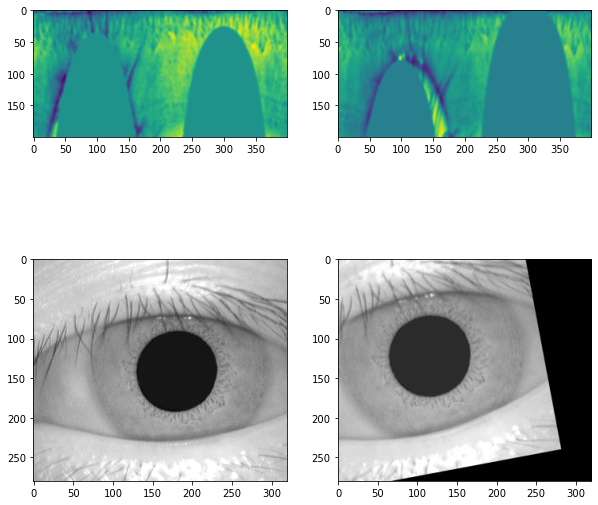

(<matplotlib.image.AxesImage at 0x1c19eac25c8>,
 None)

In [67]:
killer_iris_enhanced = enhanced_iris[iris_labels==perp_fing[0]]
killer_iris = iris_images[iris_labels==perp_fing[0]]
fig, ax = plt.subplots(nrows = 2, ncols = 2, figsize=(10,10))
_=ax[0,0].imshow(killer_iris_enhanced[0], cmap='viridis'), ax[0,1].imshow(enhanced_perp, cmap='viridis'),
ax[1,0].imshow(killer_iris[0], cmap='gray'), ax[1,1].imshow(perpetrator_iris, cmap='gray'), plt.show()

## IV Multimodal System

### 1. Score Fusion

<div class="alert alert-block alert-success">
<b>Q12: </b> Fuse your iris and fingerprint biometric system on the score level to solve the murder case! Do you feel confident in your prediction? How do you fuse the scores? Why?
</div>

#### 1.1. Construct similarity matrix

In [68]:
comb = lambda s1, s2: s1*8/11 + s2*3/11 
comb_df = sim_mat_mean_hybrid.combine(sim_mat_iris, comb)
comb_df

s2,01,02,03,04,05,06,07,08,09,10
s1,,,,,,,,,,
01,0.047782,0.023996,0.042818,0.039472,0.041342,0.044278,0.042805,0.039197,0.036087,0.041293
02,0.042494,0.108811,0.048602,0.048450,0.042736,0.044120,0.038524,0.038434,0.040926,0.048475
03,0.044127,0.034941,0.054524,0.045055,0.046624,0.046432,0.034903,0.039750,0.040936,0.039930
04,0.044420,0.033907,0.036248,0.064833,0.008293,0.037055,0.041156,0.040887,0.037063,0.022221
05,0.041045,0.035872,0.036177,0.053353,0.138043,0.048234,0.038294,0.035804,0.038620,0.044515
06,0.035847,0.031535,0.041192,0.044409,0.039558,0.123898,0.038365,0.034592,0.038060,0.048020
07,0.035967,0.038280,0.039566,0.044142,0.044576,0.037013,0.090629,0.035700,0.040975,0.037286
08,0.033606,0.032236,0.044374,0.042539,0.036826,0.039457,0.033760,0.118940,0.035823,0.038139
09,0.038172,0.038582,0.048289,0.008634,0.040526,0.040809,0.035775,0.040742,0.192464,0.009329


#### 1.2. Model evaluation


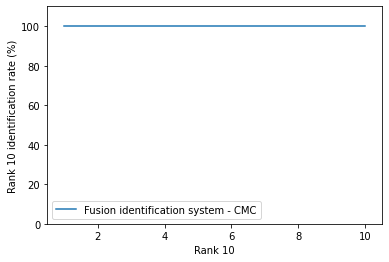

In [69]:
ranks_fusion, hits_per_rank_fusion = CMC(comb_df.to_numpy())
plotCMC(ranks_fusion, hits_per_rank_fusion, 'Fusion identification system - CMC')

### 2. Solve the murder case

In [70]:
perp_fing = find_perp(comb_df)

KeyError: 'Perp'

## V. Assignment Instructions
Both a report and the implementation in this notebook have to be submitted to toledo. <u>The notebook functions as supplementary material only!</u> The report should be self contained. Feel free to add figures, code and mathematics in the report if you feel comfortable. Try to be concice and to the point!  

1. Follow the instructions in the notebook and discuss results/impact in your report.
2. <b>Choose a number of tasks equivalent to <u>at least 5pts</u> from the list below (pts are not related to the grades): </b>
    1. [FING and IRIS] OpenCV provides different KeyPoint detectors and descriptors (ORB, SIFT, SURF, BRIEF, ...). Briefly test, visually, which of these seem to extract relatively reliable interesting points from the fingerprints or iris dataset (you can skip the ones that require a lisence). (1pt)
    2. [FING or IRIS] Evaluate your biometric system on 3 other datasets (you can find a lot of unused data in the data directory or on the internet) (1pt)
    3. [FING and IRIS] Evaluate your biometric system in an authentication scenario, do you still aggregate the similarity scores? Why? (1pt)
    5. [IRIS] Play around with the gabor filter bank, what is the effect of the parameters? Can you setup a databank that results in better features? (1pt)
    6. [IRIS] Can you find a better way to aggregate the gabor feature maps? Analyse and report. (1pt)
    6. [IRIS] Compare local hybrid and global features for the iris data (1pt).
    3. [FING or IRIS] Attempt to improve the segmentation, evaluate. (2pt)
    4. [FING or IRIS] Attempt to improve the registration procedure. (2pt)
    6. [FING or IRIS] Attempt to improve the feature extraction using a completely different technique. Evaluate your results. (2pt) 
    7. [MULTI] Fuse your modalities on the feature level instead of the score level (2pt)
    7. [ . ] Create a biometric identification or authentication system on a modality of choice and evaluate it (5pt)
        - e.g. on smartphone usage patterns 
        - Excludes; Fingerprints, irises and faces
        
<b> 8. [FING or IRIS] Create a machine learning based identification/authentication system and evaluate it (5pt)
        - e.g. based on deep learning 
        - training is required, transfer learning is allowed 
3. All results should be discussed in detail in your report. </b>


<em>Note: Indicate clearly which tasks you end up choosing and where we can find the implementations and/or results. </em> <br>
<em>Note 2: Usually there are multiple valid solutions, you should always defend your approach and verbally compare it to the other approaches (possible advantages/disadvantages) in your report! If you do not provide proper reasoning we can not give you the grades you deserve! </em>

Good luck, have fun!

In [71]:
#L: Create a ML based identification/authentication system and evaluate it
import tensorflow as tf
import tensorflow.keras
from keras.applications import VGG16
from keras.models import Model, Sequential
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Flatten
from keras_preprocessing.image import ImageDataGenerator
from keras.optimizers import RMSprop, SGD
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.utils import to_categorical
from keras.callbacks import EarlyStopping
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

Make each label an integer: 

In [72]:
iris_labels_new = iris_labels.astype(int)
iris_labels_new

array([ 1,  1,  1,  2,  2,  2,  3,  3,  3,  4,  4,  4,  5,  5,  5,  6,  6,
        6,  7,  7,  7,  8,  8,  8,  9,  9,  9, 10, 10, 10])

Read the DB in RGB, to make it an appropriate input for the network later. 

In [73]:
def read_iris_DB_RGB(path):
    images = []
    labels = []
    imagePaths = sorted(glob.glob(os.path.join(path, '*/1/*.bmp')))
    for imagePath in imagePaths:
        label = imagePath.split('\\')[-3] 
        image = cv2.imread(imagePath)
        
        # we only read data of the first 10 subjects
        if label == '011':
            break

        images.append(image)
        labels.append(label[1:])

    return np.array(images), np.array(labels)

iris_images_new, _ = read_iris_DB_RGB(iris_data_path)

Preprocess the input images:

In [74]:
from keras.applications.vgg16 import VGG16, preprocess_input

def preprocess(data):
    images = []
    dataset = data.copy()
    for i in range(dataset.shape[0]):
        image = dataset[i]
        #resize image
        tensor_image = tf.convert_to_tensor(image, dtype=tf.float32)
        tensor_image = tf.image.resize(tensor_image, [224,224])
        image = tensor_image.numpy()
        image = preprocess_input(image)
        images = images + [image]
    
    preprocessed_data = np.stack(images, axis=0)
    return preprocessed_data

In [75]:
train_data = preprocess(iris_images_new)
train_data.shape

(30, 224, 224, 3)

Split the dataset:
2/3 of the images of each person will belong to the training set and the rest 1/3 will go to the test set

In [76]:
train_copy = train_data.copy()
iris_labels_copy = iris_labels_new.copy()
indices_to_delete_train = np.arange(2,30,3)

y_test = iris_labels_copy[0:30:3]
x_test = train_copy[0:30:3]
print(x_test.shape)

x_train = np.delete(train_copy, indices_to_delete, 0)
print(x_train.shape)
y_train = np.delete(iris_labels_copy, indices_to_delete)

new_train_y = to_categorical(y_train, 11)
new_test_y = to_categorical(y_test, 11)

(10, 224, 224, 3)


NameError: name 'indices_to_delete' is not defined

Define the model:

In [279]:
def vgg_model():
    #Load pretrained model
    pretrained_model = VGG16()
    
    #remove output layer
    model = Model(pretrained_model.input, pretrained_model.layers[-3].output)
    x = model.output
    x = Dense(11, activation='softmax')(x) #Add the Fully Connected layer
    model = Model(model.input, x)
    
    #Freeze all layers except output layer (Make them non-trainable)
    for layer in model.layers[0:-1]:
        layer.trainable = False
        
    return model

In [ ]:
final_model = vgg_model() 
final_model = Sequential([final_model]) #Make it a sequential model to be able to run predict_classes

rms = RMSprop(lr=0.001)
final_model.compile(loss='categorical_crossentropy', optimizer = rms, metrics=['accuracy'])

#Fit model to start training
history = final_model.fit(x_train, new_train_y, batch_size=30, epochs=15)
ypred = final_model.predict_classes(x_test)

Get the new predicted labels and accuracy:

In [281]:
ypred

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10], dtype=int64)

In [399]:
acc = accuracy_score(y_test, ypred)
acc

1.0

In [283]:
#Identify the perpetrator through the Neural Network
perp_rgb = cv2.cvtColor(perpetrator_iris,cv2.COLOR_GRAY2RGB)
killer_pred = final_model.predict_classes(preprocess(np.array([perp_rgb])))
killer_pred

array([2], dtype=int64)

Build the similarity matrix from the output probability vectors of the ANN:

In [300]:
#construct similarity matrix
sim_mat_ml_np = final_model.predict(x_test)
sim_mat_ml = pd.DataFrame(sim_mat_ml_np)
sim_mat_ml = sim_mat_ml.drop(0, axis=1)
sim_mat_ml.set_index(y_test)

,1,2,3,4,5,6,7,8,9,10
1,9.998554e-01,6.772582e-07,1.402532e-04,7.633777e-09,3.181308e-06,2.311223e-07,1.765831e-07,9.568439e-09,2.647823e-08,2.977402e-08
2,3.821686e-04,9.996141e-01,8.146264e-07,2.966723e-09,4.058888e-07,2.135648e-06,1.545765e-07,6.725839e-09,1.007523e-08,3.275266e-07
3,6.570951e-05,1.112912e-05,9.999220e-01,1.502157e-08,7.052839e-08,1.024096e-07,1.903826e-08,1.178124e-11,8.880767e-07,1.201179e-08
4,7.989780e-08,2.193573e-07,3.013052e-07,9.999870e-01,9.567747e-07,1.105183e-10,1.914340e-07,3.826742e-09,1.887521e-06,9.317725e-06
5,1.748238e-06,9.473418e-08,1.271492e-06,1.684098e-06,9.999682e-01,1.936189e-07,6.558160e-06,1.703513e-07,6.304070e-06,1.385268e-05
6,1.574756e-06,7.992112e-06,2.049329e-05,9.450678e-09,1.680354e-07,9.999688e-01,7.194272e-07,2.587776e-08,2.416250e-07,2.956450e-08
7,2.617448e-08,2.011558e-06,5.243772e-08,9.467923e-07,3.555428e-05,1.082634e-07,9.999444e-01,3.473890e-08,2.455438e-07,1.653505e-05
8,1.661494e-03,2.086765e-07,4.472960e-06,4.847498e-05,5.294589e-05,4.430503e-07,7.003556e-05,9.979107e-01,1.386138e-04,1.126130e-04
9,3.947683e-04,1.174125e-03,1.011871e-03,3.086434e-05,4.854931e-04,1.980844e-04,1.633089e-05,4.514507e-05,9.966097e-01,3.357053e-05
10,1.078294e-09,7.802531e-07,2.667903e-09,4.468834e-07,8.675288e-09,1.200815e-09,2.280934e-09,4.007770e-09,7.339791e-10,9.999988e-01


In [432]:
#Normalize values
x = sim_mat_ml.values
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x)
sim_mat_ml = pd.DataFrame(x_scaled)
sim_mat_ml

,0,1,2,3,4,5,6,7,8,9
0,1.00000,0.00000,0.00014,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000
1,0.00038,1.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000
2,0.00007,0.00001,1.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00000
3,0.00000,0.00000,0.00000,1.00000,0.00000,0.0000,0.00000,0.00000,0.00000,0.00001
4,0.00000,0.00000,0.00000,0.00000,1.00000,0.0000,0.00001,0.00000,0.00001,0.00001
5,0.00000,0.00001,0.00002,0.00000,0.00000,1.0000,0.00000,0.00000,0.00000,0.00000
6,0.00000,0.00000,0.00000,0.00000,0.00004,0.0000,1.00000,0.00000,0.00000,0.00002
7,0.00166,0.00000,0.00000,0.00005,0.00005,0.0000,0.00007,1.00000,0.00014,0.00011
8,0.00039,0.00117,0.00101,0.00003,0.00049,0.0002,0.00002,0.00005,1.00000,0.00003
9,0.00000,0.00000,0.00000,0.00000,0.00000,0.0000,0.00000,0.00000,0.00000,1.00000


Evaluate the ML system with CMC:

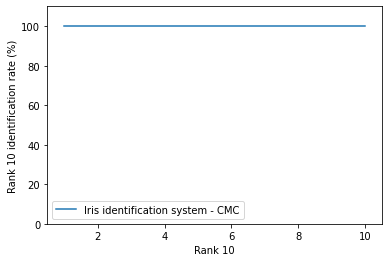

In [308]:
ranks_ml, hits_per_rank_ml = CMC(sim_mat_ml.to_numpy())
plotCMC(ranks_ml, hits_per_rank_ml, 'Iris identification system - CMC')

## Acknowledgements
1) We use the Fingerprint Verification Competition'2002 Database ([FVC'2002](http://bias.csr.unibo.it/fvc2002/default.asp)). This was the second in a series of benchmark tests that were made publically available. While we do not have access to the full (880 images) database, a subset is freely accessible.

2) We use the CASIA1 Iris database [CASIA1](http://www.cbsr.ia.ac.cn/irisdatabase/irisdatabase.php). You can find more information [here](http://www.cbsr.ia.ac.cn/IrisDatabase.htm).